In [1]:
# Importing libraries
!pip install bokeh

In [2]:
import pandas as pd
import numpy as np

In [3]:
# Read in the airports data.
airports = pd.read_csv("https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat", header=None, dtype=str)
airports.columns = ["id", "name", "city", "country", "code", "icao", "latitude", "longitude", "altitude", "offset", "dst", "timezone", "type","source"]

In [4]:
airports.head()

,id,name,city,country,code,icao,latitude,longitude,altitude,offset,dst,timezone,type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689834590001,145.391998291,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20707988739,145.789001465,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789855957031,144.29600524902344,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380355834961,147.22000122070312,146,10,U,Pacific/Port_Moresby,airport,OurAirports


In [5]:
# Read in the airlines data.
airlines = pd.read_csv("https://raw.githubusercontent.com/jpatokal/openflights/master/data/airlines.dat", header=None, dtype=str)
airlines.columns = ["id", "name", "alias", "iata", "icao", "callsign", "country", "active"]

In [6]:
airlines.head()

,id,name,alias,iata,icao,callsign,country,active
0,-1,Unknown,\N,-,NaN,\N,\N,Y
1,1,Private flight,\N,-,NaN,NaN,NaN,Y
2,2,135 Airways,\N,NaN,GNL,GENERAL,United States,N
3,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
4,4,2 Sqn No 1 Elementary Flying Training School,\N,NaN,WYT,NaN,United Kingdom,N


In [7]:

# Read in the routes data.
routes = pd.read_csv("https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat", header=None, dtype=str)
routes.columns = ["airline", "airline_id", "source", "source_id", "dest", "dest_id", "codeshare", "stops", "equipment"]

In [8]:
routes.head()

,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [9]:
routes.airline_id.value_counts()

4296     2484
24       2354
5209     2180
2009     1981
5265     1960
1767     1454
1758     1263
751      1260
4547     1146
2297     1130
137      1071
3320      923
596       877
2822      831
3090      830
4611      815
214       798
1316      726
330       705
4951      658
3737      576
2660      555
1355      549
324       547
439       530
4319      504
8745      488
\N        479
130       473
2548      470
         ... 
1230        4
3781        4
116         4
11963       4
1392        4
17023       4
43          3
11814       2
2094        2
18700       2
4436        2
2757        2
106         2
1769        2
2881        2
20565       2
563         2
442         2
19944       2
4165        2
16625       2
17095       2
29          2
109         2
9620        2
17519       2
4496        2
1775        2
2731        2
2260        1
Name: airline_id, Length: 548, dtype: int64

In [10]:
routes[routes['airline_id']=="\\N"].shape

(479, 9)

In [11]:
routes[routes['airline_id']=="\\N"].head()

,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment
312,3H,\N,AKV,5506,YIK,5504,NaN,0,DH8
313,3H,\N,AKV,5506,YPX,6727,NaN,0,DH8
314,3H,\N,XGR,5512,YVP,154,NaN,0,DHT BET
315,3H,\N,YGL,62,YGW,5496,NaN,0,DHT
316,3H,\N,YGL,62,YPX,6727,NaN,0,73M


In [12]:
#Removing these from the dataset
routes=routes[routes['airline_id']!="\\N"]

In [13]:
routes.isnull().sum()

airline           0
airline_id        0
source            0
source_id         0
dest              0
dest_id           0
codeshare     52595
stops             0
equipment        16
dtype: int64

# Making a histogram
We'll first make a histogram showing the distribution of route lengths by airlines. A histogram divides all the route lengths into ranges (or "bins"), and counts how many routes fall into each range. This can tell us if airlines fly more shorter routes, or more longer ones.

In order to do this, we need to first calculate route lengths. The first step is a distance formula. We'll use haversine distance, which calculates the distance between latitude, longitude pairs.

The haversine formula determines the great-circle distance between two points on a sphere given their longitudes and latitudes. Important in navigation, it is a special case of a more general formula in spherical trigonometry, the law of haversines, that relates the sides and angles of spherical triangles.

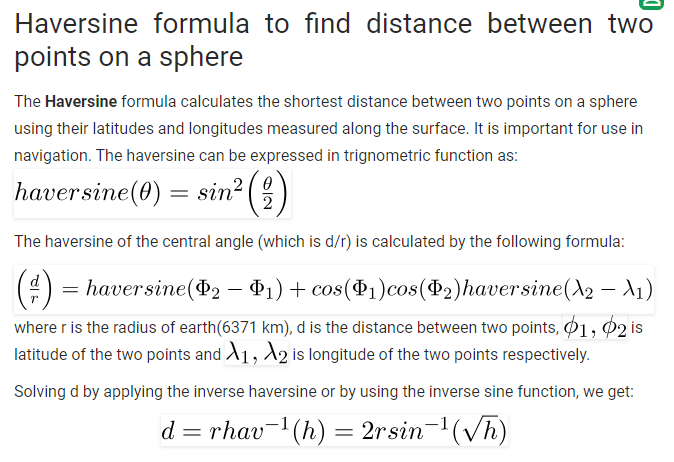

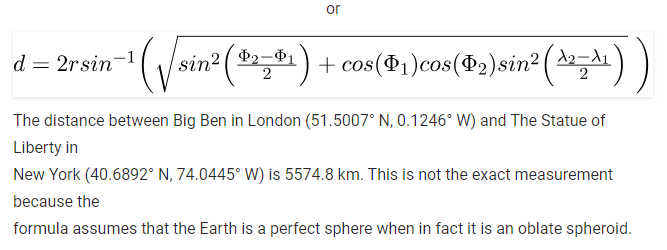

In [14]:
import math

def haversine(lon1, lat1, lon2, lat2):
    # Convert coordinates to floats.
    lon1, lat1, lon2, lat2 = [float(lon1), float(lat1), float(lon2), float(lat2)]
    # Convert to radians from degrees.
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])
    # Compute distance.
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.asin(math.sqrt(a)) 
    km = 6367 * c
    return km

Then we can make a function that calculates distance between the source and dest airports for a single route. To do this, we need to get the source_id and dest_id airports from the routes dataframe, then match them up with the id column in the airports dataframe to get the latitude and longitude of those airports. Then, it's just a matter of doing the calculation. 

In [15]:
def calc_dist(row):
    dist = 0
    try:
        # Match source and destination to get coordinates.
        source = airports[airports["id"] == row["source_id"]].iloc[0]
        dest = airports[airports["id"] == row["dest_id"]].iloc[0]
        # Use coordinates to compute distance.
        dist = haversine(dest["longitude"], dest["latitude"], source["longitude"], source["latitude"])
    except (ValueError, IndexError):
        pass
    return dist

In [16]:
route_lengths = routes.apply(calc_dist, axis=1)

In [17]:
route_lengths.shape

(67184,)

In [18]:
import matplotlib.pyplot as plt
%matplotlib inline

(array([2.3102e+04, 1.9736e+04, 9.9470e+03, 5.2980e+03, 2.5900e+03,
        1.0630e+03, 8.3900e+02, 1.0170e+03, 9.1200e+02, 7.7100e+02,
        6.4900e+02, 5.5300e+02, 2.4700e+02, 2.3200e+02, 1.4600e+02,
        4.4000e+01, 3.2000e+01, 2.0000e+00, 0.0000e+00, 4.0000e+00]),
 array([    0.        ,   803.60790186,  1607.21580372,  2410.82370558,
         3214.43160744,  4018.0395093 ,  4821.64741116,  5625.25531302,
         6428.86321489,  7232.47111675,  8036.07901861,  8839.68692047,
         9643.29482233, 10446.90272419, 11250.51062605, 12054.11852791,
        12857.72642977, 13661.33433163, 14464.94223349, 15268.55013535,
        16072.15803721]),
 <a list of 20 Patch objects>)

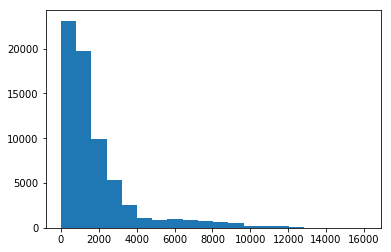

In [19]:
plt.hist(route_lengths,bins=20)

In [20]:
# #ALternate Way
# new_data=routes.copy()
# pd.m

/home/jupyterlab/conda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


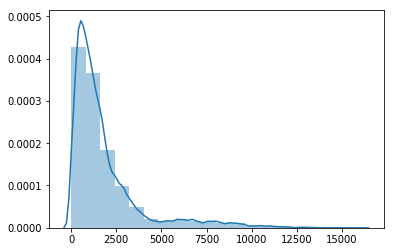

In [21]:
import seaborn as sns
sns.distplot(route_lengths,bins=20)

In [22]:
import numpy as np

In [23]:
route_length_df=pd.DataFrame()
route_length_df['length']=route_lengths
route_length_df['id']=routes['airline_id']

In [24]:
airline_route_lengths =route_length_df.groupby(by='id').mean()

In [25]:
airline_route_lengths.sort_values(by='length',ascending=False,inplace=True)

We first make a new dataframe with the route lengths and the airline ids. We split route_length_df into groups based on the airline_id, essentially making one dataframe per airline. We then use the pandas aggregate function to take the mean of the length column in each airline dataframe, and recombine each result into a new dataframe. We then sort the dataframe so that the airlines with the most routes come first.

In [26]:
airline_route_lengths.head()

,length
id,
11806,7261.375734
3201,6332.122085
1008,5861.986606
1299,4943.942048
2183,4708.663933


In [27]:
airline_route_lengths.shape

(547, 1)

<BarContainer object of 547 artists>

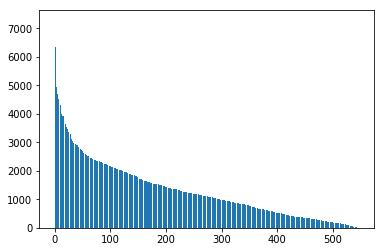

In [28]:
plt.bar(range(airline_route_lengths.shape[0]), airline_route_lengths["length"])

The matplotlib plt.bar method plots each airline against the average route length each airline flies(airline_route_lengths["length"]).

The problem with the plot above is that we can't easily see which airline has what route length. In order to do this, we'll need to be able to see the axis labels. This is a bit tough since there are so many airlines. One way to make this easier to work with is to make the plot interactive, which will allow us to zoom in and out to see the labels. We can use the bokeh library for this -- it makes it simple to make interactive, zoomable plots.

In [29]:
#preprocess data for bokeh.

In [30]:
def lookup_name(row):
    try:
        # Match the row id to the id in the airlines dataframe so we can get the name.
        name = airlines["name"][airlines["id"] == row["id"]].iloc[0]
    except (ValueError, IndexError):
        name = ""
    return name

In [31]:
# Add the index (the airline ids) as a column.
airline_route_lengths["id"] = airline_route_lengths.index.copy()
# Find all the airline names.
airline_route_lengths["name"] = airline_route_lengths.apply(lookup_name, axis=1)
# Remove duplicate values in the index.
airline_route_lengths.index = range(airline_route_lengths.shape[0])

In [32]:
airline_route_lengths.head()

,length,id,name
0,7261.375734,11806,Compagnie Africaine d\\'Aviation
1,6332.122085,3201,LAN Argentina
2,5861.986606,1008,Albanian Airlines
3,4943.942048,1299,Arkefly
4,4708.663933,2183,Emirates


The code above will get the names for each row in airline_route_lengths, and add in the name column, which contains the name of each airline. We also add in the id column so we can do this lookup (the apply function doesn't pass in an index).

Finally, we reset the index column to have all unique values. Bokeh doesn't work properly without this.

In [33]:
from bokeh.io import output_notebook
from bokeh.plotting  import figure, show

In [34]:
#http://bokeh.pydata.org/en/latest/docs/user_guide/categorical.html
#https://bokeh.pydata.org/en/latest/docs/user_guide/notebook.html#jupyterlab
#---------
import numpy as np
from bokeh.io import output_notebook, show
#from bokeh.charts import Bar, show
from bokeh.plotting import figure

output_notebook()

#airline_route_lengths2 = airline_route_lengths[:10]

airline_name = airline_route_lengths.name
avg_route_length = airline_route_lengths.length

Loading BokehJS ...

Bokeh make it simple to create basic bar charts using the hbar() and vbar() glyphs methods. In the example below, we have the following sequence of simple 1-level factors:

To inform Bokeh that the x-axis is categorical, we pass this list of factors as the x_range argument to :fund:~bokeh.plotting.figure.figure:

p = figure(x_range=fruits, ... )
Note that passing the list of factors is a convenient shorthand notation for creating a FactorRange. The equivalent explicit notation is:

p = figure(x_range=FactorRange(factors=fruits), ... )

This more explicit for is useful when you want to customize the FactorRange, e.g. by changing the range or category padding.

Next we can call vbar with the list of fruit name factors as the x coordinate, the bar height as the top coordinate, and optionally any width or other properties that we would like to set:

p.vbar(x=fruits, top=[5, 3, 4, 2, 4, 6], width=0.9)

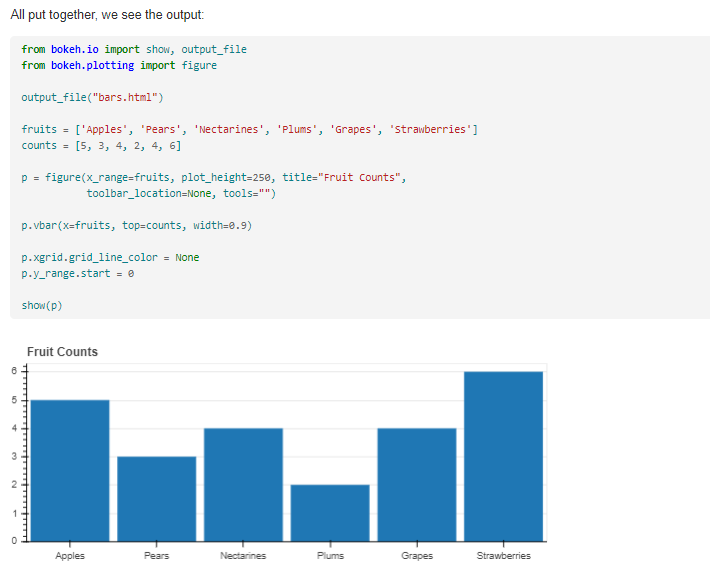


In [35]:

p = figure(x_range=list(airline_name), plot_height=450, plot_width=1200, title="Airline Route Lengths")

In [36]:
p.vbar(x=list(airline_name), top=avg_route_length, width=1.9)

p.xgrid.grid_line_color = None
p.y_range.start = 0
#p.xaxis.major_label_orientation = "vertical"
p.xaxis.major_label_orientation = math.pi/4


show(p)

In [37]:
#showing only the few top routes to eliminate the clutter

output_notebook()

airline_route_lengths10 = airline_route_lengths[:20]

airline_name10 = airline_route_lengths10.name
avg_route_length10 = airline_route_lengths10.length

p10 = figure(x_range=airline_name10, plot_height=450, plot_width=800, title="Airline Route Lengths to 10",
            toolbar_location="below")

p10.vbar(x=airline_name10, top=avg_route_length, width=1.9)

p10.xgrid.grid_line_color = None
p10.y_range.start = 0
#p.xaxis.major_label_orientation = "vertical"
p10.xaxis.major_label_orientation = math.pi/4


show(p10)

Loading BokehJS ...

## Horizontal bar charts

Pygal is a python data analysis library that makes attractive charts quickly. We can use it to make a breakdown of routes by length. We'll first divide our routes into short, medium, and long, and calculate the percentage of each in our route_lengths.

In [38]:
long_routes = len([k for k in route_lengths if k > 10000]) / len(route_lengths)
medium_routes = len([k for k in route_lengths if k < 10000 and k > 2000]) / len(route_lengths)
short_routes = len([k for k in route_lengths if k < 2000]) / len(route_lengths)

In [39]:
long_routes

0.009005120266730175

In [40]:
short_routes

0.7300547749464158

We can then plot each one as a bar in a pygal horizontal bar chart:

In [41]:
!pip install pygal

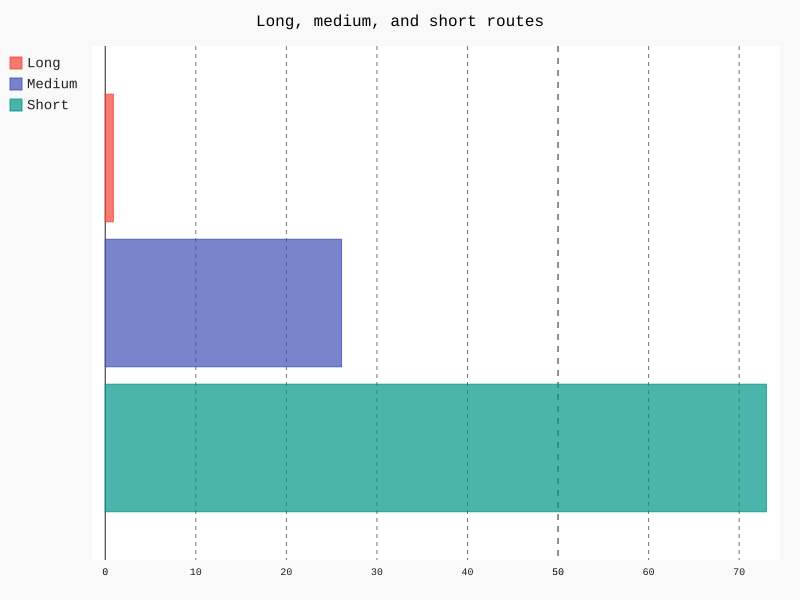

In [42]:
import pygal
from IPython.display import SVG

chart = pygal.HorizontalBar()
chart.title = 'Long, medium, and short routes'
chart.add('Long', long_routes * 100)
chart.add('Medium', medium_routes * 100)
chart.add('Short', short_routes * 100)
chart.render_to_file('routes.svg')
SVG(filename='routes.svg')

Above, we first create an empty chart. Then, we add elements, including a title and bars. Each bar is passed a percentage value (out of 100) showing how common that type of route is.

Finally, we render the chart to a file, and use IPython's SVG display capabilities to load and show the file. This plot looks quite a bit nicer than the default matplotlib charts, but we did need to write more code to create it. Pygal may be good for small presentation-quality graphics.

# Scatter plots
Scatter plots enable us to compare columns of data. We can make a simple scatter plot to compare airline id number to length of airline names:

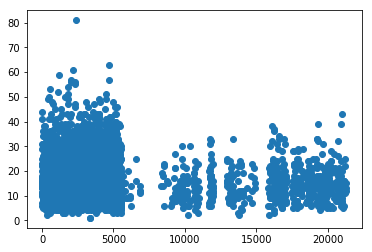

In [43]:
name_lengths = airlines["name"].apply(lambda x: len(str(x)))
plt.scatter(airlines["id"].astype(int), name_lengths)

First we calculate the length of each name by using the pandas apply method. This will find the number of characters long each airline name is.

We then make a scatter plot comparing the airline ids to the name lengths using matplotlib. When we plot, we convert the id column of airlines to an integer type. If we don't do this, the plot won't work, as it needs numeric values on the x-axis. We can see that quite a few of the longer names appear in the earlier ids. This may mean that airlines founded earlier tend to have longer names.

We can verify this hunch using seaborn. Seaborn has an augmented version of a scatterplot, a joint plot, that shows how correlated the two variables are, as well as the individual distributions of each.

In [44]:
data=pd.DataFrame({"lengths":name_lengths,"ids":airlines['id'].astype(int)})

In [45]:
data.head()

,lengths,ids
0,7,-1
1,14,1
2,11,2
3,13,3
4,44,4


/home/jupyterlab/conda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


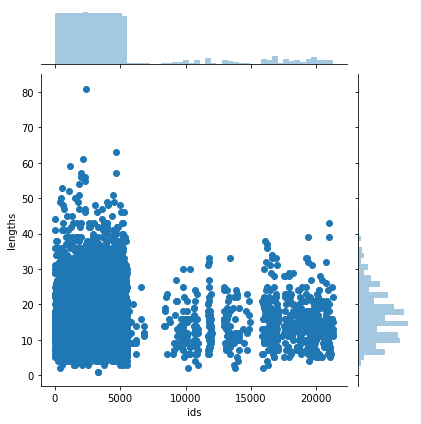

In [46]:
z=sns.jointplot(x="ids", y="lengths", data=data)

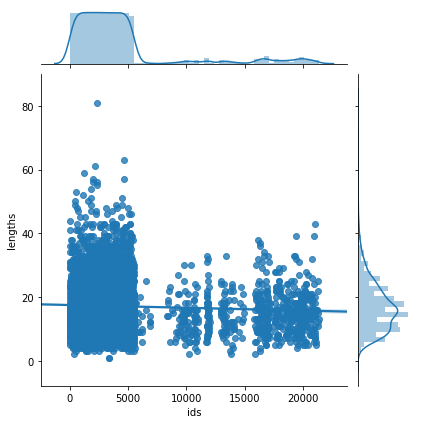

In [47]:
z=sns.jointplot(x="ids", y="lengths", data=data,kind="reg")

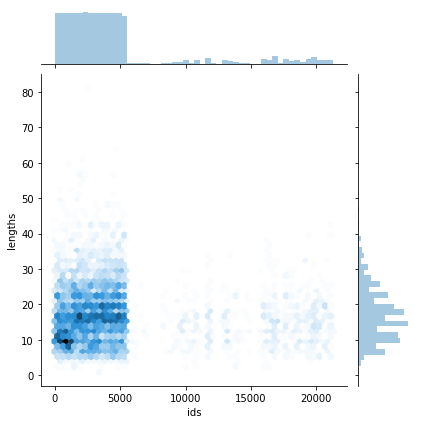

In [48]:
z=sns.jointplot(x="ids", y="lengths", data=data,kind="hex")

## Static maps
Our data is inherently a good fit for mapping -- we have latitude and longitude pairs for airports, and for source and destination airports.

The first map we can make is one that shows all the airports all over the world. We can do this with the basemap extension to matplotlib. This enables drawing world maps and adding points, and is very customizable.

In [49]:
# Import the basemap package
from mpl_toolkits.basemap import Basemap

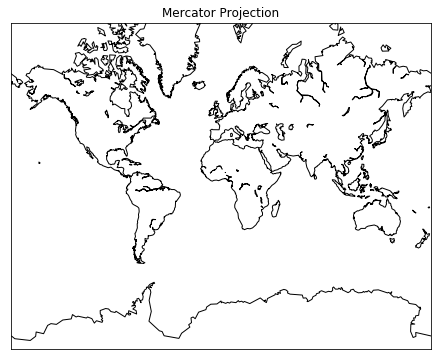

In [50]:
plt.figure(figsize=(10,6))
m=Basemap(projection="merc",llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,resolution='c')
m.drawcoastlines()
plt.title("Mercator Projection")
plt.show()

https://basemaptutorial.readthedocs.io/en/latest/basemap.html

Argument	Description

llcrnrlon	The lower left corner geographical longitude

llcrnrlat	The lower left corner geographical latitude

urcrnrlon	The upper right corner geographical longitude

urcrnrlat	The upper right corner geographical latitude

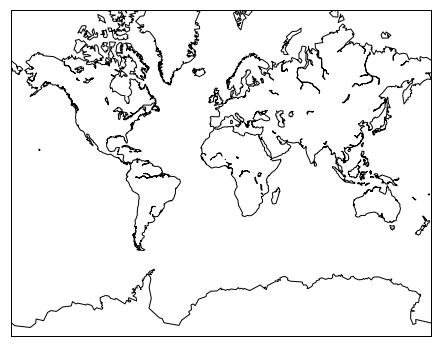

In [51]:
plt.figure(figsize=(10,6))
# Create a map on which to draw.  We're using a mercator projection, and showing the whole world.
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')

# Draw coastlines, and the edges of the map.
m.drawcoastlines()
m.drawmapboundary()
plt.show()

In [ ]:
#airport names have non-ascii characters
#replacing non-ascii with blanks
#https://stackoverflow.com/questions/36340627/removing-non-ascii-characters-and-replacing-with-spaces-from-pandas-data-frame
#
from string import printable
st = set(printable)
airports["name"] = airports["name"].apply(lambda x: ''.join([" " if  i not in  st else i for i in x]))

In [ ]:
# Create a map on which to draw.  We're using a mercator projection, and showing the whole world.
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
# Draw coastlines, and the edges of the map.
m.drawcoastlines()
m.drawmapboundary()
# Convert latitude and longitude to x and y coordinates
x, y = m(list(airports["longitude"].astype(float)), list(airports["latitude"].astype(float)))
# Use matplotlib to draw the points onto the map.
m.scatter(x,y,1,marker='o',color='red')
# Show the plot.
plt.show()

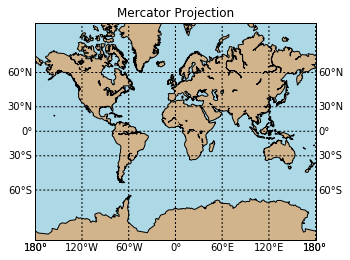

In [53]:
# Create a map on which to draw.  We're using a mercator projection, and showing the whole world.
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
# Draw coastlines, and the edges of the map.
m.drawcoastlines()
m.drawmapboundary()
m.fillcontinents(color='tan',lake_color='lightblue')

# draw parallels and meridians.
m.drawparallels(np.arange(-90.,91.,30.),labels=[True,True,False,False],dashes=[2,2])
m.drawmeridians(np.arange(-180.,181.,60.),labels=[False,False,False,True],dashes=[2,2])
m.drawmapboundary(fill_color='lightblue')
plt.title("Mercator Projection")
plt.show()

In [ ]:
!pip install folium

In [ ]:

import folium
airports_map = folium.Map(location=[60, 0], zoom_start=2)
airports_map

In [ ]:

import folium
airports_map = folium.Map(location=[10, 20], zoom_start=2)
airports_map

In [ ]:
# import folium
# airports_map = folium.Map(location=[22.572645,88.363892], zoom_start=2)
# airports_map

In [ ]:
# import folium
# airports_map = folium.Map(location=[22,88], zoom_start=2)
# airports_map

In [ ]:
# Randomly sample 7 elements from your dataframe
airports_R = airports.sample(n=10)

# mark each station as a point
for index, row in airports_R.iterrows():
    if row["name"] != "South Pole Station":
        folium.CircleMarker([float(row['latitude']), float(row['longitude'])],
                        radius=2,
                        popup=row['name'],
                        fill_color="red", # divvy color
                       ).add_to(airports_map)
airports_map

In [ ]:

# mark each station as a point
for index, row in airports.iterrows():
    if row["name"] != "South Pole Station":
        folium.CircleMarker([float(row['latitude']), float(row['longitude'])],
                        radius=2,
                        popup=row['name'],
                        fill_color="red", # divvy color
                       ).add_to(airports_map)
airports_map

In [55]:

import folium
airports_map = folium.Map(location=[10, 20], zoom_start=2)
airports_map


# mark each station as a point
for index, row in airports.iterrows():
    if row["name"] != "South Pole Station":
        folium.CircleMarker([float(row['latitude']), float(row['longitude'])],
                        radius=2,
                        popup=row['name'],
                        fill_color="red", # divvy color
                       ).add_to(airports_map)
airports_map


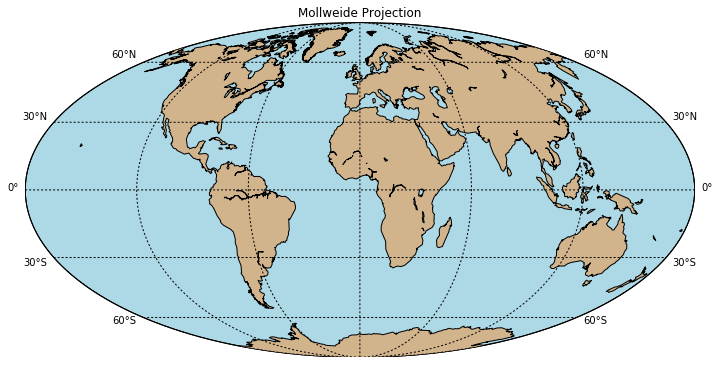

In [56]:
fig = plt.figure(num=None, figsize=(12, 8) )
m = Basemap(projection='moll',lon_0=0,resolution='c')    
m.drawcoastlines()
m.fillcontinents(color='tan',lake_color='lightblue')
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,91.,30.),labels=[True,True,False,False],dashes=[2,2])
m.drawmeridians(np.arange(-180.,181.,60.),labels=[False,False,False,False],dashes=[2,2])
m.drawmapboundary(fill_color='lightblue')
plt.title("Mollweide Projection");

Folium uses leaflet.js to make a fully interactive map. You can click on each airport to see the name in the popup. A screenshot is shown above, but the actual map is much more impressive. Folium also lets you modify options pretty extensively to make nicer markers, or add more things to the map.

Drawing great circles
It would be pretty cool to see all the air routes on a map. Luckily, we can use basemap to do this. We'll draw great circles connecting source and destination airports. Each circle will show the route of a single airliner. Unfortunately, there are so many routes that showing them all would be a mess. Instead, we'll show the first 3000 routes.

AttributeError: can't set attribute

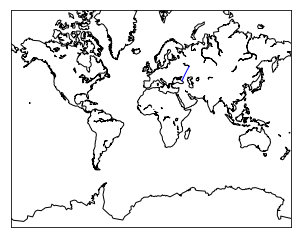

In [57]:
# Make a base map with a mercator projection.  Draw the coastlines.
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m.drawcoastlines()


# Iterate through the first 3000 rows.
for name, row in routes[:3000].iterrows():
    try:
        # Get the source and dest airports.
        source = airports[airports["id"] == row["source_id"]].iloc[0]
        dest = airports[airports["id"] == row["dest_id"]].iloc[0]
        # Don't draw overly long routes.
        if abs(float(source["longitude"]) - float(dest["longitude"])) < 90:
            # Draw a great circle between source and dest airports.
            m.drawgreatcircle(float(source["longitude"]), float(source["latitude"]), float(dest["longitude"]), float(dest["latitude"]),linewidth=1,color='b')
    except (ValueError, IndexError):
        pass
    
# Show the map.
plt.show()

### Drawing network diagrams
The final exploration we'll do is drawing a network diagram of airports. Each airport will be a node in the network, and we'll draw edges between nodes if there's a route between the airports. If there are multiple routes, we'll add to the edge weight, to show that the airports are more connected. We'll use the networkx library to do this.

First, we'll need to compute the edge weights between airports.

In [58]:
# Initialize the weights dictionary.
weights = {}
# Keep track of keys that have been added once -- we only want edges with a weight of more than 1 to keep our network size manageable.
added_keys = []
# Iterate through each route.
for name, row in routes.iterrows():
    # Extract the source and dest airport ids.
    source = row["source_id"]
    dest = row["dest_id"]
    
    # Create a key for the weights dictionary.
    # This corresponds to one edge, and has the start and end of the route.
    key = "{0}_{1}".format(source, dest)
    # If the key is already in weights, increment the weight.
    if key in weights:
        weights[key] += 1
    # If the key is in added keys, initialize the key in the weights dictionary, with a weight of 2.
    elif key in added_keys:
        weights[key] = 2
    # If the key isn't in added_keys yet, append it.
    # This ensures that we aren't adding edges with a weight of 1.
    else:
        added_keys.append(key)

In [59]:
# Import networkx and initialize the graph.
import networkx as nx

In [60]:
graph = nx.Graph()
# Keep track of added nodes in this set so we don't add twice.
nodes = set()
# Iterate through each edge.
for k, weight in weights.items():
    try:
        # Split the source and dest ids and convert to integers.
        source, dest = k.split("_")
        source, dest = [int(source), int(dest)]
        # Add the source if it isn't in the nodes.
        if source not in nodes:
            graph.add_node(source)
        # Add the dest if it isn't in the nodes.
        if dest not in nodes:
            graph.add_node(dest)
        # Add both source and dest to the nodes set.
        # Sets don't allow duplicates.
        nodes.add(source)
        nodes.add(dest)
        
        # Add the edge to the graph.
        graph.add_edge(source, dest, weight=weight)
    except (ValueError, IndexError):
        pass

pos=nx.spring_layout(graph)

/home/jupyterlab/conda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


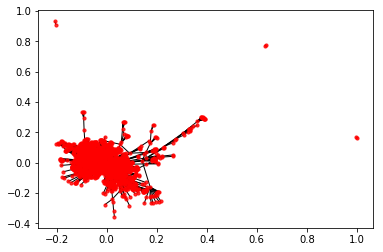

In [61]:
# Draw the nodes and edges.
nx.draw_networkx_nodes(graph,pos, node_color='red', node_size=10, alpha=0.8)
nx.draw_networkx_edges(graph,pos,width=1.0,alpha=1)

# Show the plot.
plt.show()